<a href="https://colab.research.google.com/github/pokopoko02/pokopoko02/blob/main/clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ライブラリのインポート

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from pandas_profiling import ProfileReport

#dfの取得

In [ ]:
# 目的とするwebページへアプローチ 
url = 'https://baseball-data.com/stats/hitter-all/avg-3.html' 
# ページ上のhtmlテーブルを読み込む 
dfs = pd.read_html(url, index_col=[0])
df = dfs[0]

# カラムの定義 日本語名だと
#col=["選手名","チーム","打率","試合","打席数","打数","安打","本塁打","打点","盗塁","四球","死球","三振","犠打","併殺打","出塁率","長打率","OPS","RC27","XR27"]
col=["Player_Name","Team","Batting_average","Games","Number_of_at_bats","Bats","hits","Home_runs","Runs_batted_in","Stolen_bases","walks","Dead_ball","Strikeouts","Sacrifice_hits","hits_for_extra_bases","on-base_percentage","Long-base_hit_rate","OPS","RC27","XR27"]
# dfのカラムを焼き直す
df = df.set_axis(col, axis = 1)

# 山田のデータを手入力
data=[["2018山田　哲人","ヤクルト","0.315","140","637","524","165","34","89","33","106","4","119","0","8","0.432","0.582","1.014","0","0"]]
# dataframeに変換
row=pd.DataFrame(data=data,columns=col, index=[0])
df = pd.concat([row, df])
#indexを揃える
df=df.reset_index().drop('index', axis=1)

df.head()

,Player_Name,Team,Batting_average,Games,Number_of_at_bats,Bats,hits,Home_runs,Runs_batted_in,Stolen_bases,walks,Dead_ball,Strikeouts,Sacrifice_hits,hits_for_extra_bases,on-base_percentage,Long-base_hit_rate,OPS,RC27,XR27
0,2018山田 哲人,ヤクルト,0.315,140,637,524,165,34,89,33,106,4,119,0,8,0.432,0.582,1.014,0,0
1,松本 剛,日本ハム,0.347,117,445,395,137,3,44,21,32,4,42,10,13,0.398,0.438,0.836,6.41,6.05
2,吉田 正尚,オリックス,0.335,119,508,412,138,21,88,4,80,9,41,0,11,0.447,0.561,1.008,9.48,9.09
3,村上 宗隆,ヤクルト,0.318,141,612,487,155,56,134,12,118,7,128,0,7,0.458,0.71,1.168,11.54,11.08
4,大島 洋平,中日,0.314,109,482,436,137,1,20,11,34,9,52,3,1,0.376,0.367,0.743,5.7,5.39


# 可視化

In [ ]:
# Pandas-Profilingをインストール
!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip

# Pandas-Profilingの依存関係パッケージのダウングレード
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/ydataai/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#pandas-profiling,K_means法を使用する時のため、object型をfloat型に変換する 
df["Batting_average"] = df["Batting_average"].astype("float")
df["Games"] = df["Games"].astype("float")
df["Number_of_at_bats"] = df["Number_of_at_bats"].astype("float")
df["Bats"] = df["Bats"].astype("float")
df["hits"] = df["hits"].astype("float")
df["Home_runs"] = df["Home_runs"].astype("float")
df["Runs_batted_in"] = df["Runs_batted_in"].astype("float")
df["Stolen_bases"] = df["Stolen_bases"].astype("float")
df["walks"] = df["walks"].astype("float")
df["Dead_ball"] = df["Dead_ball"].astype("float")
df["Strikeouts"] = df["Strikeouts"].astype("float")
df["Sacrifice_hits"] = df["Sacrifice_hits"].astype("float")
df["hits_for_extra_bases"] = df["hits_for_extra_bases"].astype("float")
df["on-base_percentage"] = df["on-base_percentage"].astype("float")
df["Long-base_hit_rate"] = df["Long-base_hit_rate"].astype("float")
df["OPS"] = df["OPS"].astype("float")
df["RC27"] = df["RC27"].astype("float")
df["XR27"] = df["XR27"].astype("float")

In [ ]:
#print(df.dtypes)

In [ ]:
profile_df = ProfileReport(df, explorative=False)
profile_df.to_file("profile_df.html")
profile_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.head()

,Player_Name,Team,Batting_average,Games,Number_of_at_bats,Bats,hits,Home_runs,Runs_batted_in,Stolen_bases,walks,Dead_ball,Strikeouts,Sacrifice_hits,hits_for_extra_bases,on-base_percentage,Long-base_hit_rate,OPS,RC27,XR27
0,2018山田 哲人,ヤクルト,0.315,140.0,637.0,524.0,165.0,34.0,89.0,33.0,106.0,4.0,119.0,0.0,8.0,0.432,0.582,1.014,0.00,0.00
1,松本 剛,日本ハム,0.347,117.0,445.0,395.0,137.0,3.0,44.0,21.0,32.0,4.0,42.0,10.0,13.0,0.398,0.438,0.836,6.41,6.05
2,吉田 正尚,オリックス,0.335,119.0,508.0,412.0,138.0,21.0,88.0,4.0,80.0,9.0,41.0,0.0,11.0,0.447,0.561,1.008,9.48,9.09
3,村上 宗隆,ヤクルト,0.318,141.0,612.0,487.0,155.0,56.0,134.0,12.0,118.0,7.0,128.0,0.0,7.0,0.458,0.710,1.168,11.54,11.08
4,大島 洋平,中日,0.314,109.0,482.0,436.0,137.0,1.0,20.0,11.0,34.0,9.0,52.0,3.0,1.0,0.376,0.367,0.743,5.70,5.39


#K-Means最終レポート版

---



In [ ]:
#データの形式、欠損等の確認
print('データ形式(X,y):{}'.format(df.shape))
print('欠損データの数:{}'.format(df.isnull().sum().sum()))

データ形式(X,y):(49, 20)
欠損データの数:0


In [ ]:
#使用するデータの抽出
col='Batting_average	hits　Home_runs　Stolen_bases walks Strikeouts on-base_percentage Long-base_hit_rate'.split()
#別のDataFrameに登録する
df_sub = ddff = df[col]


# 標準化
sc = StandardScaler()
sc.fit(df_sub)
df_sub_std = sc.transform(df_sub)

In [ ]:
#df_sub.info()

11    2
3     3
5     1
7     6
2     4
10    7
9     3
4     7
6     1
8     4
1     6
0     5
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

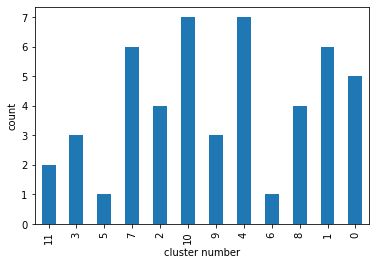

In [ ]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=12, random_state=0)

# クラスターの重心を計算
kmeans.fit(df_sub_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number')

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

Text(0, 0.5, 'Distortion')

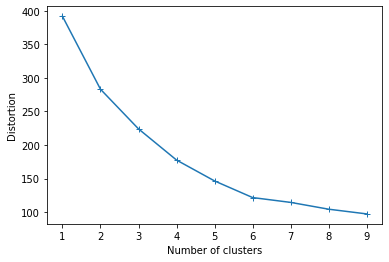

In [ ]:
# エルボー方による推定。クラスター数を1から10に増やして、それぞれの距離の総和を求める
dist_list =[]
for i in range(1,10):
    kmeans= KMeans(n_clusters=i, init='random', random_state=0)
    kmeans.fit(df_sub_std)
    dist_list.append(kmeans.inertia_)
    
# グラフを表示
plt.plot(range(1,10), dist_list,marker='+')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

Text(0, 0.5, 'Distortion')

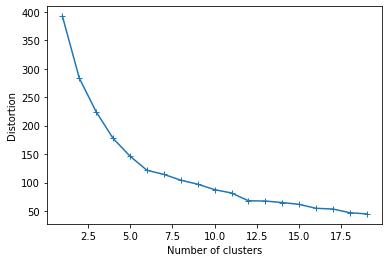

In [ ]:
# エルボー方による推定。クラスター数を1から20に増やして、それぞれの距離の総和を求める
dist_list =[]
for i in range(1,20):
    kmeans= KMeans(n_clusters=i, init='random', random_state=0)
    kmeans.fit(df_sub_std)
    dist_list.append(kmeans.inertia_)
    
# グラフを表示
plt.plot(range(1,20), dist_list,marker='+')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

#K-Meansの評価

In [ ]:
# データにクラスター番号のデータを結合
df_with_cluster = pd.concat([df_sub, labels], axis=1)

# 先頭の5行を表示
df_with_cluster.head()

,Batting_average,hits,Home_runs,Stolen_bases,walks,Strikeouts,on-base_percentage,Long-base_hit_rate,cluster_number
0,0.315,165.0,34.0,33.0,106.0,119.0,0.432,0.582,11
1,0.347,137.0,3.0,21.0,32.0,42.0,0.398,0.438,3
2,0.335,138.0,21.0,4.0,80.0,41.0,0.447,0.561,5
3,0.318,155.0,56.0,12.0,118.0,128.0,0.458,0.710,11
4,0.314,137.0,1.0,11.0,34.0,52.0,0.376,0.367,3


In [ ]:
#predf.info()

In [ ]:
# 分割のための区切りを設定
bins = [0,1,2,3,4,5,10,15,20,25,30,35]#,40,45]

# 上の区切りをもとに野球選手のデータを分割した、qcut_Stolen_bases変数を設定
qcut_Stolen_bases = pd.cut(df_with_cluster.Stolen_bases, bins, right=False)

# クラスタ番号と盗塁数を結合
dfconcat = pd.concat([df_with_cluster.cluster_number, qcut_Stolen_bases], axis=1)

# クラスタ番号を軸に集計し、盗塁数を列に設定
cross_cluster_Stolen_bases = dfconcat.groupby(['cluster_number', 'Stolen_bases']).size().unstack().fillna(0)
cross_cluster_Stolen_bases

Stolen_bases,"[0, 1)","[1, 2)","[2, 3)","[3, 4)","[4, 5)","[5, 10)","[10, 15)","[15, 20)","[20, 25)","[25, 30)","[30, 35)"
cluster_number,,,,,,,,,,,
0,0,0,2,0,1,0,1,1,0,0,0
1,0,0,6,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,2,0,1
3,0,0,0,1,0,0,1,0,1,0,0
4,2,0,2,1,0,0,1,1,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0
7,1,1,2,1,0,1,0,0,0,0,0
8,1,1,0,0,1,1,0,0,0,0,0


In [ ]:
# 分割したデータ数をカウント
hist_Stolen_bases = pd.value_counts(qcut_Stolen_bases)
hist_Stolen_bases

[2, 3)      12
[10, 15)     9
[4, 5)       5
[20, 25)     5
[0, 1)       4
[3, 4)       3
[5, 10)      3
[15, 20)     3
[1, 2)       2
[30, 35)     2
[25, 30)     0
Name: Stolen_bases, dtype: int64

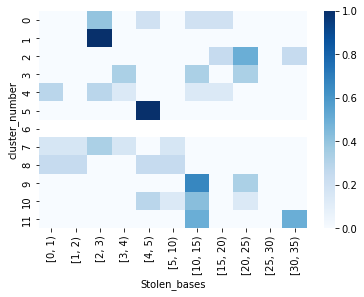

In [ ]:
sns.heatmap(cross_cluster_Stolen_bases.apply(lambda x : x/x.sum(), axis=1), cmap='Blues')

In [ ]:
# 分割のための区切りを設定
bins = [0,5,10,15,20,25,30,35]#,40,45,50,55,60]

# 上の区切りをもとに野球選手のデータを分割した、qcut_Homeruns変数を設定
qcut_Home_runs = pd.cut(df_with_cluster.Home_runs, bins, right=False)

# クラスタ番号と本塁打数を結合
dfconcat = pd.concat([df_with_cluster.cluster_number, qcut_Home_runs], axis=1)

# クラスタ番号を軸に集計し、本塁打数を列に設定
cross_cluster_Home_runs = dfconcat.groupby(['cluster_number', 'Home_runs']).size().unstack().fillna(0)
cross_cluster_Home_runs

Home_runs,"[0, 5)","[5, 10)","[10, 15)","[15, 20)","[20, 25)","[25, 30)","[30, 35)"
cluster_number,,,,,,,
0,0,1,1,2,1,0,0
1,1,5,0,0,0,0,0
2,2,2,0,0,0,0,0
3,2,1,0,0,0,0,0
4,0,1,2,1,3,0,0
5,0,0,0,0,1,0,0
6,1,0,0,0,0,0,0
7,0,0,2,2,2,0,0
8,0,0,0,0,0,2,1


In [ ]:
# 分割したデータ数をカウント
hist_Home_runs = pd.value_counts(qcut_Home_runs)
hist_Home_runs

[5, 10)     13
[0, 5)      10
[20, 25)     9
[15, 20)     6
[10, 15)     5
[25, 30)     2
[30, 35)     2
Name: Home_runs, dtype: int64

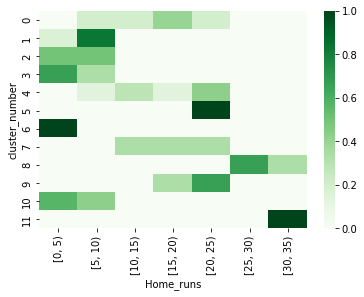

In [ ]:
sns.heatmap(cross_cluster_Home_runs.apply(lambda x : x/x.sum(), axis=1), cmap='Greens')

In [ ]:
# 分割のための区切りを設定
bins = [0.2,0.2125,0.225,0.2375,0.25,0.2625,0.275,0.2875,0.3,0.4]#0.3125,0.325,0.3375,0.35]

# # 上の区切りをもとに野球選手のデータを分割した、qcut_Batting_average変数を設定
qcut_Batting_average = pd.cut(df_with_cluster.Batting_average, bins, right=False)

# クラスタ番号と打率を結合
dfconcat = pd.concat([df_with_cluster.cluster_number, qcut_Batting_average], axis=1)

# クラスタ番号を軸に集計し、打率を列に設定
cross_cluster_Batting_average = dfconcat.groupby(['cluster_number', 'Batting_average']).size().unstack().fillna(0)
cross_cluster_Batting_average

Batting_average,"[0.2, 0.212)","[0.212, 0.225)","[0.225, 0.238)","[0.238, 0.25)","[0.25, 0.262)","[0.262, 0.275)","[0.275, 0.288)","[0.288, 0.3)","[0.3, 0.4)"
cluster_number,,,,,,,,,
0,0,4,0,1,0,0,0,0,0
1,0,1,0,3,1,1,0,0,0
2,0,0,0,0,0,0,2,2,0
3,0,0,0,0,0,0,0,1,2
4,0,0,0,0,1,5,1,0,0
5,0,0,0,0,0,0,0,0,1
6,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,4,2
8,0,0,0,0,2,2,0,0,0


In [ ]:
# 分割したデータ数をカウント
hist_Batting_average = pd.value_counts(qcut_Batting_average)
hist_Batting_average

[0.262, 0.275)    14
[0.288, 0.3)       7
[0.3, 0.4)         7
[0.25, 0.262)      6
[0.212, 0.225)     5
[0.238, 0.25)      5
[0.275, 0.288)     5
[0.2, 0.212)       0
[0.225, 0.238)     0
Name: Batting_average, dtype: int64

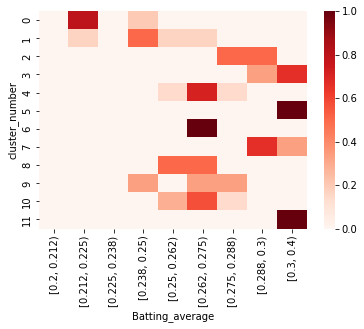

In [ ]:
sns.heatmap(cross_cluster_Batting_average.apply(lambda x : x/x.sum(), axis=1), cmap='Reds')

In [ ]:
#選手名を再結合
df_final = pd.concat([df.Player_Name, df_with_cluster], axis=1)

In [ ]:
df_final = df_final.sort_values('cluster_number')

In [ ]:
df_final.set_index('cluster_number', inplace = True)

In [ ]:
df_final

,Player_Name,Batting_average,hits,Home_runs,Stolen_bases,walks,Strikeouts,on-base_percentage,Long-base_hit_rate
cluster_number,,,,,,,,,
0,オグレディ,0.213,86.0,15.0,2.0,54.0,129.0,0.312,0.384
0,西川 遥輝,0.218,81.0,7.0,19.0,68.0,103.0,0.342,0.341
0,清宮 幸太郎,0.219,89.0,18.0,4.0,45.0,113.0,0.305,0.429
0,ポランコ,0.240,105.0,24.0,2.0,42.0,109.0,0.306,0.457
0,外崎 修汰,0.215,103.0,12.0,10.0,52.0,113.0,0.295,0.356
1,小園 海斗,0.266,126.0,7.0,2.0,24.0,76.0,0.300,0.362
1,紅林 弘太郎,0.224,101.0,6.0,2.0,26.0,71.0,0.275,0.318
1,長岡 秀樹,0.241,123.0,9.0,2.0,20.0,72.0,0.273,0.337
1,木下 拓哉,0.246,103.0,6.0,2.0,27.0,38.0,0.289,0.341


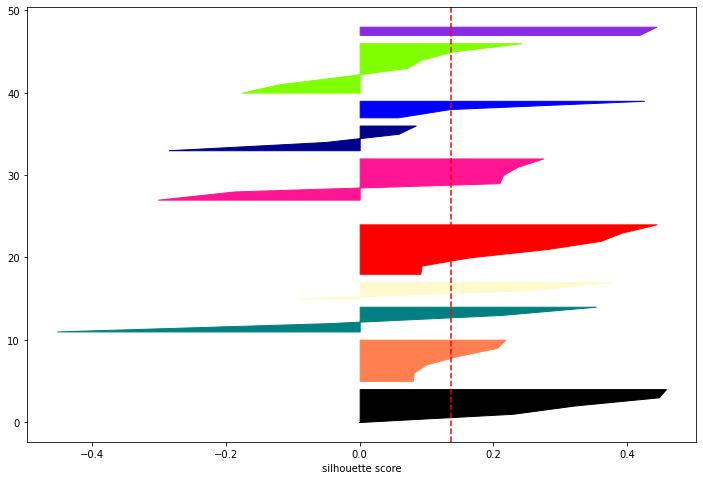

In [ ]:
#クラスター数を設定する ここはかなりサイトを参考にして書きました。正直最終課題レポートに記載するか迷った点ですが、ライブラリを活用する、ほとんどコードの変更の箇所が無かったので、変数等のみ変更して、使用しました。
#https://qiita.com/tomoxxx/items/0f3a16bb58f25c2e6cfb

n_clusters=12
silhouette_avg = silhouette_score(df_with_cluster, labels)

silhouette_scores = silhouette_samples(df_with_cluster,
                                       labels, 
                                       metric='euclidean')

colorlist = ['#000000', '#ff7f50', '#008080', '#fffacd', '#ff0000', '#afeeee', '#3cb371','#ff1493','#00008b', '#0000ff', '#7fff00','#8a2be2']

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(1, 1, 1)

y_lower = 0

for i in range(n_clusters):
    cluster_silhouette_values = silhouette_scores[labels == i]
    cluster_silhouette_values.sort()
    y_upper = y_lower + cluster_silhouette_values.shape[0]
    color = colorlist[i]
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0,cluster_silhouette_values,facecolor=color, edgecolor=color)
    y_lower = y_upper 
ax.set_xlabel('silhouette score')

ax.axvline(x=silhouette_avg, color='red', ls='--')